### Visualization analysis for the covid spike protein using the reformer model

In [1]:
from biosynseq import metrics
from biosynseq import visualize
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
import pandas as pd

In [2]:
%config InlineBackend.figure_format='retina'
%matplotlib inline
plt.rcParams['figure.figsize'] = [8,6]
plt.rcParams["font.family"] = "sans-serif"
plt.rcParams.update({'font.size':14})

In [3]:
ls /homes/mzvyagin/covid_spike_reformer

spike_reformer_10000sample_test_embeddings_mean.npy
spike_reformer_10000sample_train_embeddings_mean.npy
spike_reformer_10000sample_val_embeddings_mean.npy
test_10000_subsample.fasta
train_10000_subsample.fasta
val_10000_subsample.fasta


In [4]:
from biosynseq.metrics import get_seqs_from_fasta
from typing import List
from Bio.SeqRecord import SeqRecord
from Bio.Seq import Seq

We need to filter the DNA sequences in the FASTA files, since some of the DNA sequences are invalid, i.e. containing sequences other than "A", "T", "C", "G". 

In [5]:
def filter_dna_seqs(seqs: List[Seq]) -> List[int]:
    valid_tokens = {"A", "T", "C", "G"}
    return [i for i, seq in enumerate(seqs) if set(str(seq)) - valid_tokens]

In [6]:
def SeqRec_to_Seq(rec_list: List[SeqRecord]) -> List[Seq]:
    return list(rec.seq for rec in rec_list)

# 1. Get t-SNE plots

### Test Sequences

In [7]:
test_embed_path = Path("/homes/mzvyagin/covid_spike_reformer/spike_reformer_10000sample_test_embeddings_mean.npy")
test_fasta_path = Path("/homes/lind/MDH-pipeline/covid_spike_data/test_10000_subsample.fasta")
save_path = Path("/homes/lind/MDH-pipeline/visualize/tsne_gen.png")

In [8]:
# get DNA sequences
dna_seqs_rec = metrics.get_seqs_from_fasta(fasta_path=test_fasta_path)
dna_seqs = SeqRec_to_Seq(rec_list=dna_seqs_rec)

In [9]:
# get the indices of the invalid DNA sequences
invalid_inds = filter_dna_seqs(seqs=dna_seqs)
# print(invalid_inds)
print(len(invalid_inds))

1123


In [10]:
# clean dna sequences
dna_seqs_rec_clean = [] # list that contains only valid DNA sequences
count = 0 # count the number of invalid DNA sequences to make sure it matches the calculated invalid_inds above

for i in range(len(dna_seqs_rec)):
    if i not in invalid_inds:
        dna_seqs_rec_clean.append(dna_seqs_rec[i])
    else:
        count += 1

print(len(dna_seqs_rec))
print(len(dna_seqs_rec_clean))
print(count)

10000
8877
1123


In [11]:
# translate the cleaned DNA sequences to protein sequences
protein_seqs = metrics.dna_to_protein_seqs(dna_seqs=dna_seqs_rec_clean)

In [12]:
# clean embeddings 
# in a similar manner by including only the embeddings whose indices are NOT in invalid_inds
embed_avg = np.load(test_embed_path)

embed_avg_clean = []
for i in range(len(embed_avg)):
    if i not in invalid_inds:
        embed_avg_clean.append(embed_avg[i])

embed_avg_clean = np.array(embed_avg_clean)
print(len(embed_avg))
print(len(embed_avg_clean))

10000
8877


In [13]:
# now paint the dataframe using cleaned DNA and protein sequences
test_paint_df = pd.DataFrame(
    {
        "GC": metrics.gc_content(dna_seqs_rec_clean),
        "SequenceLength": metrics.seq_length(dna_seqs_rec_clean),
        "MolecularWeight": metrics.molecular_weight(protein_seqs),
        "IsoelectricPoint": metrics.isoelectric_point(protein_seqs),
    }
)

Your plot has been saved to /homes/lind/MDH-pipeline/visualize/tsne_gen.png


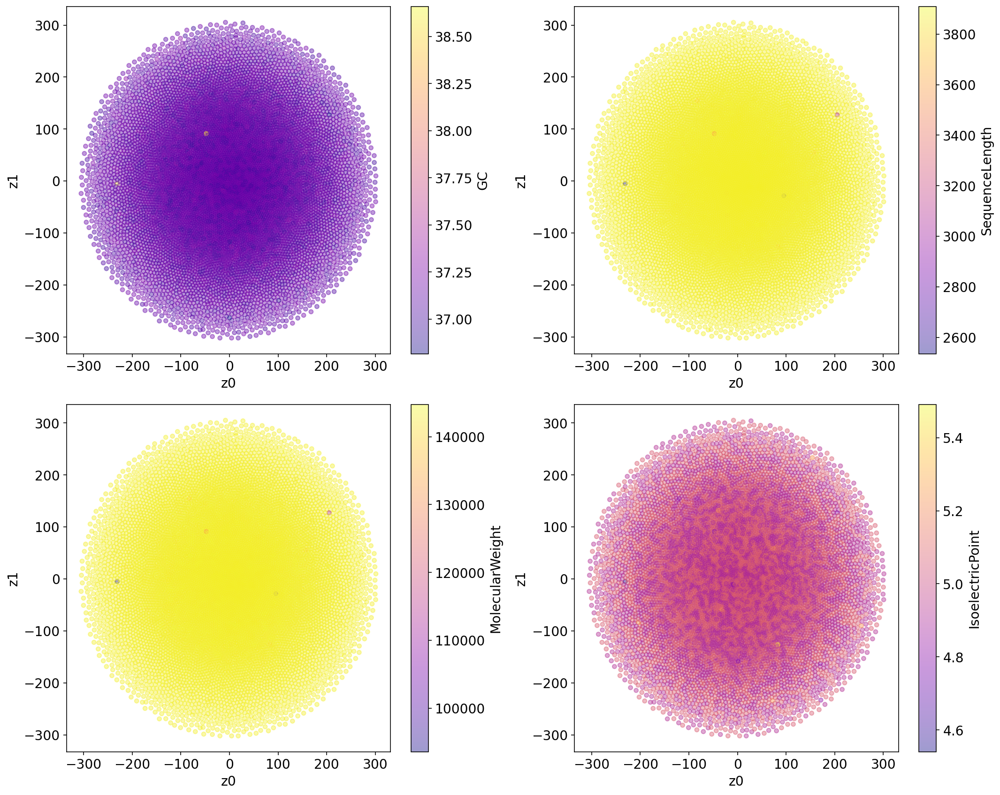

In [15]:
# plot the tsne plot using the painted dataframe
test_tsne_results = visualize.get_cluster(embed_data=embed_avg_clean, 
                                          paint_df=test_paint_df, 
                                          save_path = save_path, 
                                          tsne_umap="tsne", 
                                          get_subplots=True)

Since the t-SNE plot shows that there are outlier embedding values in GC-content, sequence length, and molecular weight, we specifically look into the value ditribution of molecular weight as an example and attempt to manually remove the outliers, to see if the t-SNE plot shows more variety in metrics values.

Text(0.5, 1.0, 'UMAP MolecularWeight')

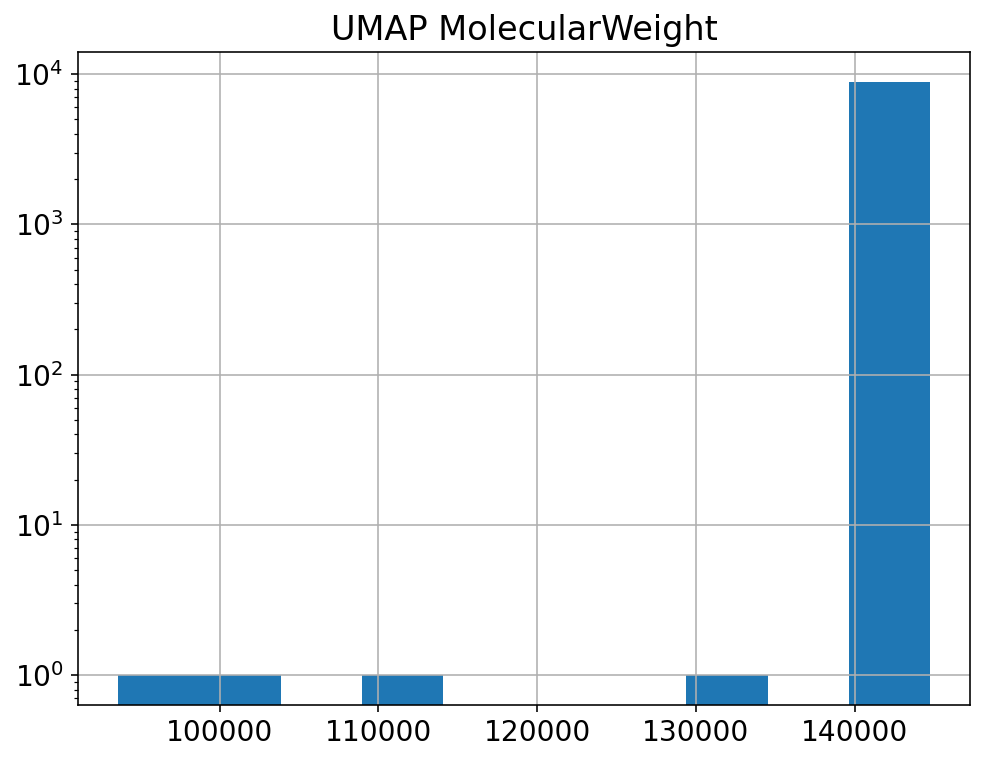

In [16]:
key = "MolecularWeight"
test_paint_df[key].hist(log=True)
plt.title("UMAP " + key)

### Train Sequences

In [17]:
train_embed_path = Path("/homes/mzvyagin/covid_spike_reformer/spike_reformer_10000sample_train_embeddings_mean.npy")
train_fasta_path = Path("/homes/lind/MDH-pipeline/covid_spike_data/train_10000_subsample.fasta")
save_path = Path("/homes/lind/MDH-pipeline/visualize/tsne_train.png")

In [18]:
# get DNA sequences
dna_seqs_rec = metrics.get_seqs_from_fasta(fasta_path=train_fasta_path)
dna_seqs = SeqRec_to_Seq(rec_list=dna_seqs_rec)

In [19]:
invalid_inds = filter_dna_seqs(seqs=dna_seqs)
# print(invalid_inds)
print(len(invalid_inds))

1108


In [20]:
# clean dna sequences
dna_seqs_rec_clean = []
count = 0

for i in range(len(dna_seqs_rec)):
    if i not in invalid_inds:
        dna_seqs_rec_clean.append(dna_seqs_rec[i])
    else:
        count += 1

print(len(dna_seqs_rec))
print(len(dna_seqs_rec_clean))
print(count)

10000
8892
1108


In [21]:
protein_seqs = metrics.dna_to_protein_seqs(dna_seqs=dna_seqs_rec_clean)

In [22]:
# clean embeddings
embed_avg = np.load(train_embed_path)

embed_avg_clean = []
for i in range(len(embed_avg)):
    if i not in invalid_inds:
        embed_avg_clean.append(embed_avg[i])

embed_avg_clean = np.array(embed_avg_clean)
print(len(embed_avg))
print(len(embed_avg_clean))

10000
8892


In [23]:
train_paint_df = pd.DataFrame(
    {
        "GC": metrics.gc_content(dna_seqs_rec_clean),
        "SequenceLength": metrics.seq_length(dna_seqs_rec_clean),
        "MolecularWeight": metrics.molecular_weight(protein_seqs),
        "IsoelectricPoint": metrics.isoelectric_point(protein_seqs),
    }
)

Your plot has been saved to /homes/lind/MDH-pipeline/visualize/tsne_train.png


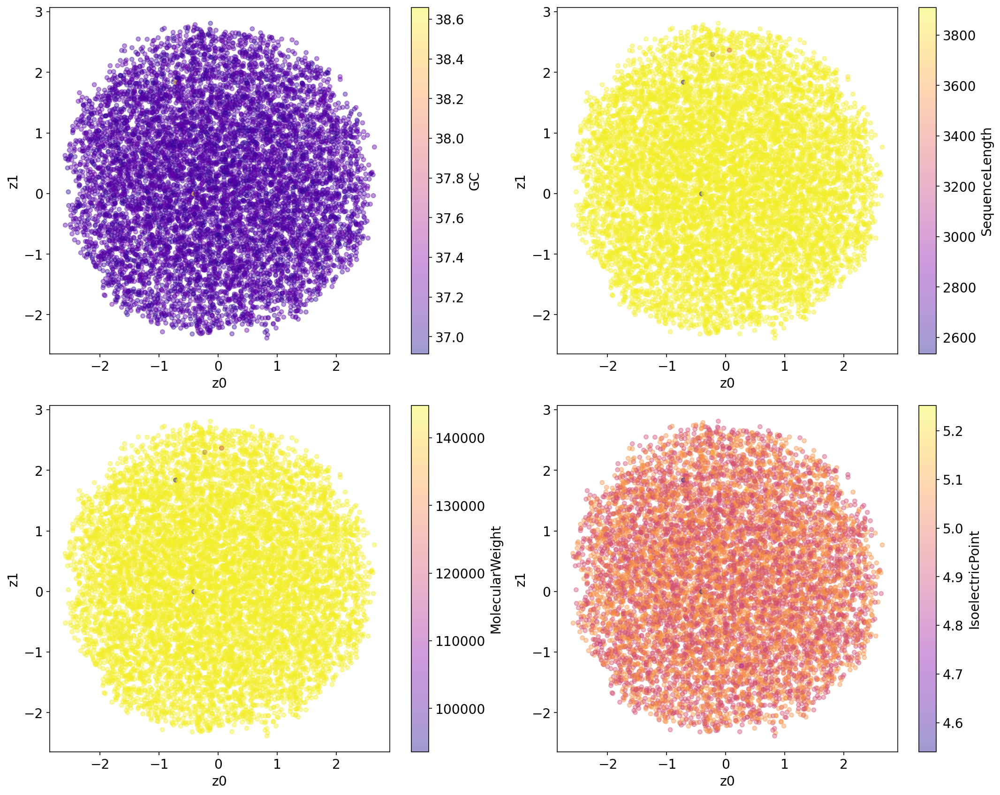

In [24]:
train_tsne_results = visualize.get_cluster(embed_data=embed_avg_clean, 
                                          paint_df=train_paint_df, 
                                          save_path = save_path,  
                                          get_subplots=True)

Text(0.5, 1.0, 'UMAP MolecularWeight')

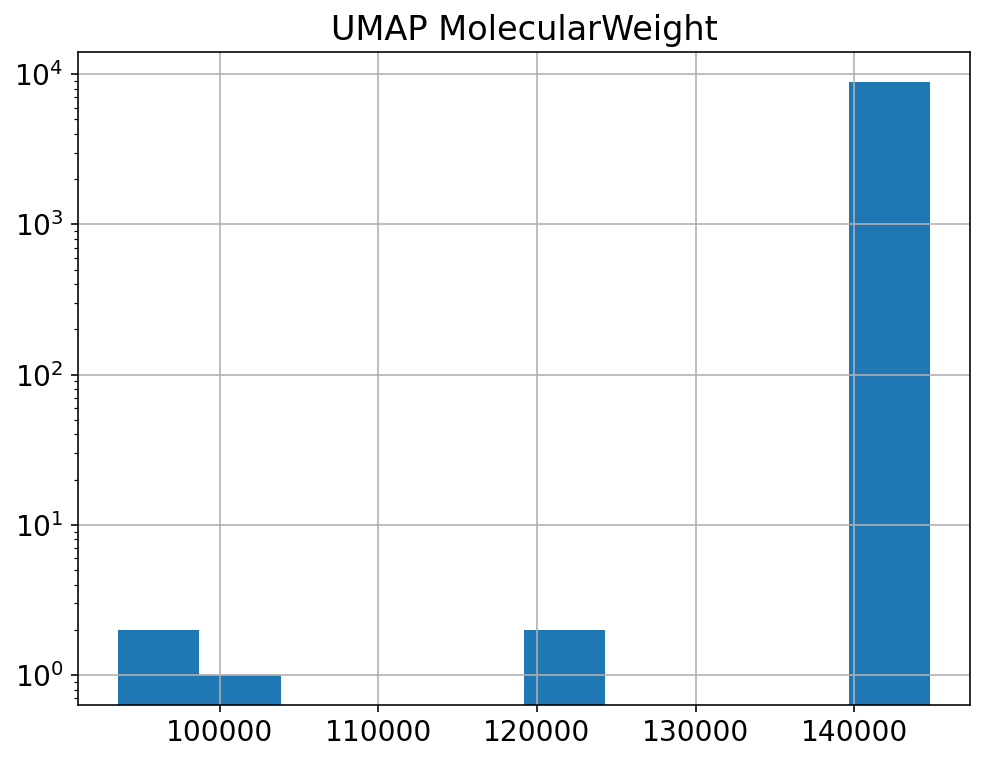

In [25]:
key = "MolecularWeight"
train_paint_df[key].hist(log=True)
plt.title("UMAP " + key)

### Validation Sequences

In [26]:
val_embed_path = Path("/homes/mzvyagin/covid_spike_reformer/spike_reformer_10000sample_val_embeddings_mean.npy")
val_fasta_path = Path("/homes/lind/MDH-pipeline/covid_spike_data/val_10000_subsample.fasta")
save_path = Path("/homes/lind/MDH-pipeline/visualize/tsne_val.png")

In [27]:
# get DNA sequences
dna_seqs_rec = metrics.get_seqs_from_fasta(fasta_path=val_fasta_path)
dna_seqs = SeqRec_to_Seq(rec_list=dna_seqs_rec)

In [28]:
invalid_inds = filter_dna_seqs(seqs=dna_seqs)
# print(invalid_inds)
print(len(invalid_inds))

1121


In [29]:
# clean dna sequences
dna_seqs_rec_clean = []
count = 0

for i in range(len(dna_seqs_rec)):
    if i not in invalid_inds:
        dna_seqs_rec_clean.append(dna_seqs_rec[i])
    else:
        count += 1

print(len(dna_seqs_rec))
print(len(dna_seqs_rec_clean))
print(count)

10000
8879
1121


In [30]:
protein_seqs = metrics.dna_to_protein_seqs(dna_seqs=dna_seqs_rec_clean)

In [31]:
# clean embeddings
embed_avg = np.load(val_embed_path)

embed_avg_clean = []
for i in range(len(embed_avg)):
    if i not in invalid_inds:
        embed_avg_clean.append(embed_avg[i])

embed_avg_clean = np.array(embed_avg_clean)
print(len(embed_avg))
print(len(embed_avg_clean))

10000
8879


In [32]:
val_paint_df = pd.DataFrame(
    {
        "GC": metrics.gc_content(dna_seqs_rec_clean),
        "SequenceLength": metrics.seq_length(dna_seqs_rec_clean),
        "MolecularWeight": metrics.molecular_weight(protein_seqs),
        "IsoelectricPoint": metrics.isoelectric_point(protein_seqs),
    }
)

Your plot has been saved to /homes/lind/MDH-pipeline/visualize/tsne_val.png


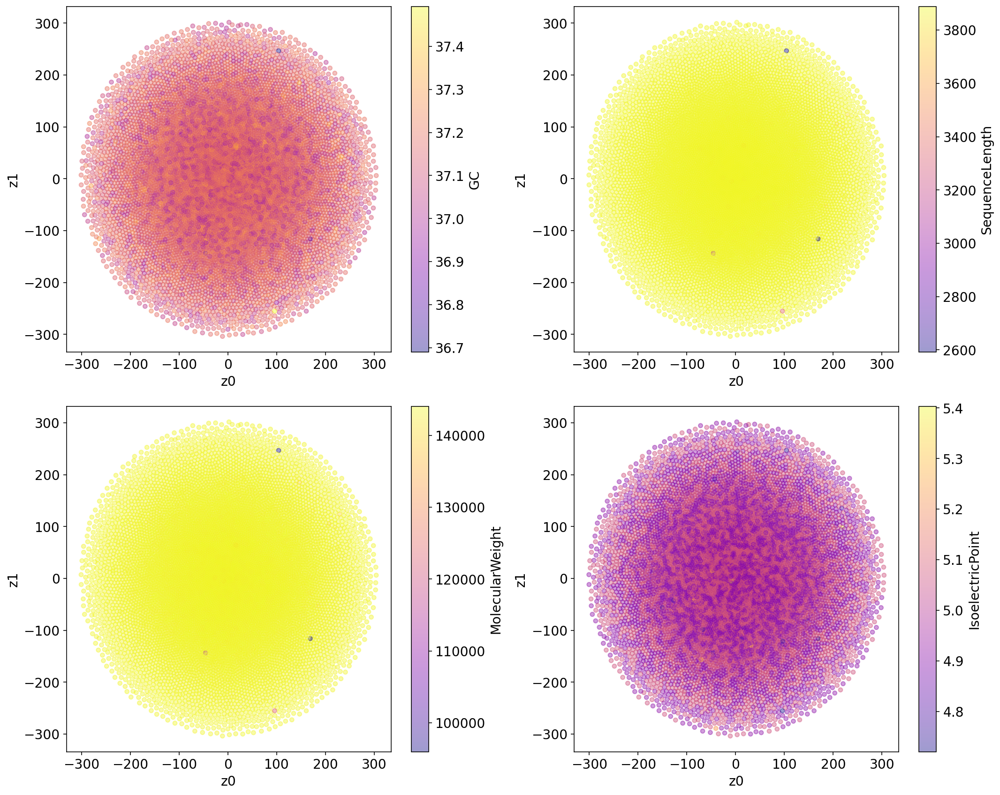

In [33]:
val_tsne_results = visualize.get_cluster(embed_data=embed_avg_clean, 
                                          paint_df=val_paint_df, 
                                          save_path = save_path, 
                                          tsne_umap="tsne", 
                                          get_subplots=True)

Text(0.5, 1.0, 'UMAP MolecularWeight')

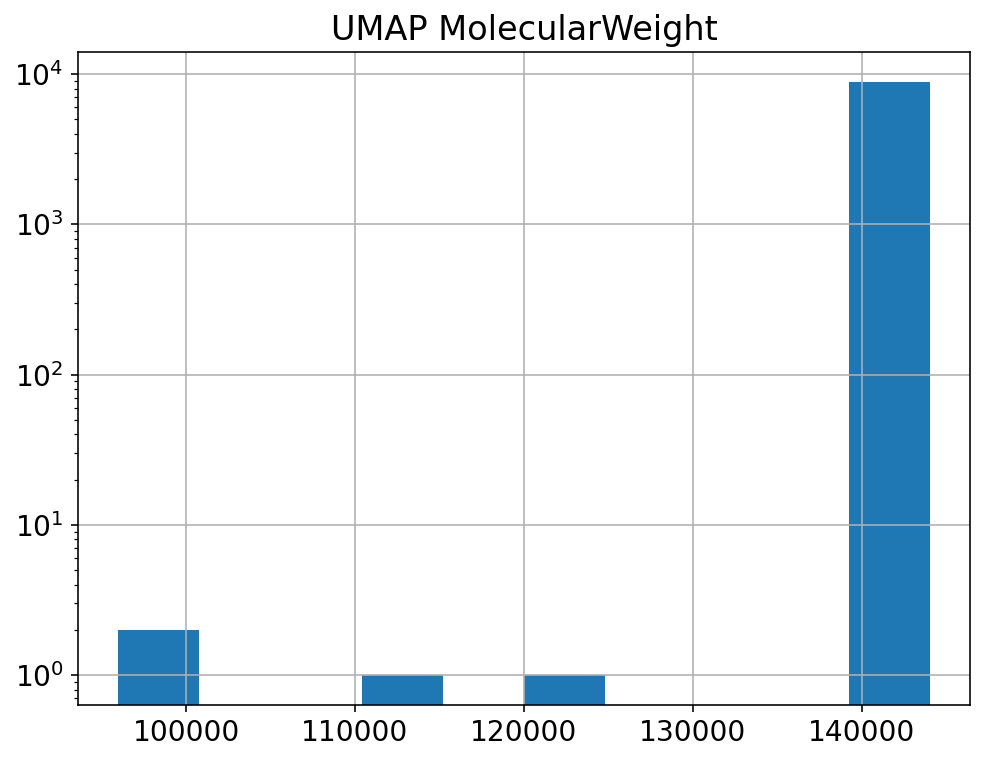

In [33]:
key = "MolecularWeight"
val_paint_df[key].hist(log=True)
plt.title("UMAP " + key)

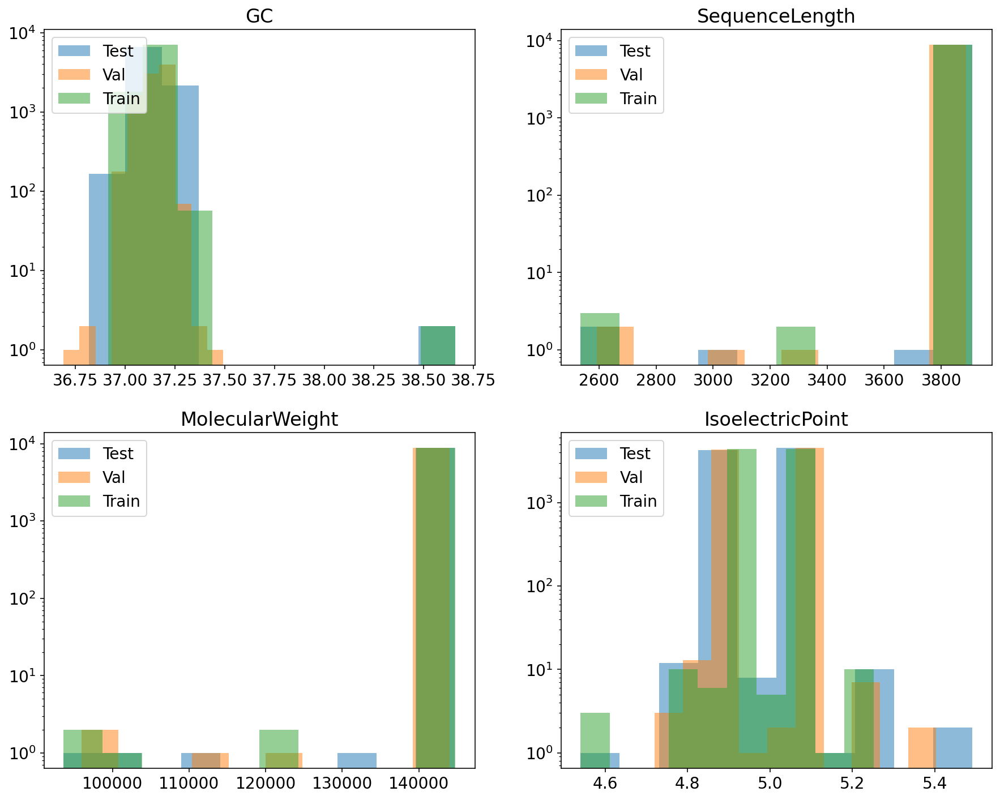

In [35]:
# Plot all test, train, validation sequences histograms together for each of the four sequence metrics
labels = ["Test", "Val", "Train"]
paint_dfs = [test_paint_df, val_paint_df, train_paint_df]
visualize.plot_metrics_hist(paint_dfs=paint_dfs, labels=labels)

# 2. Compute embedding L2 distance vs. global alignment score correlations for test, train, and validation sequences

### Test Sequences

In [36]:
test_embed_path = Path("/homes/mzvyagin/covid_spike_reformer/spike_reformer_10000sample_test_embeddings_mean.npy")
test_fasta_path = Path("/homes/lind/MDH-pipeline/covid_spike_data/test_10000_subsample.fasta")
save_path = Path("/homes/lind/MDH-pipeline/visualize/embed_dist_vs_align_score_test.png")
align_plot_title = "Test Sequences"
alignment_type = "global"
num_workers = 70
match_score = 1.0
mismatch_score = 0.0
open_gap_score = 0.0
extend_gap_score = 0.0

Clean up DNA sequences, protein sequences, and embeddings

In [37]:
# get DNA sequences
dna_seqs_rec = metrics.get_seqs_from_fasta(fasta_path=test_fasta_path)
dna_seqs = SeqRec_to_Seq(rec_list=dna_seqs_rec)

In [38]:
invalid_inds = filter_dna_seqs(seqs=dna_seqs)
# print(invalid_inds)
print(len(invalid_inds))

1123


In [39]:
# clean dna sequences
dna_seqs_rec_clean = []
count = 0

for i in range(len(dna_seqs_rec)):
    if i not in invalid_inds:
        dna_seqs_rec_clean.append(dna_seqs_rec[i])
    else:
        count += 1

print(len(dna_seqs_rec))
print(len(dna_seqs_rec_clean))
print(count)

10000
8877
1123


In [40]:
protein_seqs = metrics.dna_to_protein_seqs(dna_seqs=dna_seqs_rec_clean)

In [41]:
# clean embeddings
embed_avg = np.load(test_embed_path)

embed_avg_clean = []
for i in range(len(embed_avg)):
    if i not in invalid_inds:
        embed_avg_clean.append(embed_avg[i])

embed_avg_clean = np.array(embed_avg_clean)
print(len(embed_avg))
print(len(embed_avg_clean))

10000
8877


Get a random sample of indices and plot only the embed dist vs. align score plot for sequences with those indices, since plotting all of the datapoints would be too computationally expensive.

In [43]:
def rand_select(start, end, num) -> List[int]:
    # start: value to start at
    # end: value to end at 
    # num: how many values to get from within the range of start and end
    res = []
    for i in range(num):
        res.append(np.random.randint(start, end))
    return res

In [44]:
# Suppose we want to sample num_sample number of points. 
# Length of rand_inds_list is the actual number of points that are sampled after removing duplicate indices.

num_sample = 3600
rand_inds_list = rand_select(0, len(embed_avg_clean), num_sample)
rand_inds_list = list(set(rand_inds_list)) # remove the duplicate indices
# print(rand_inds_list)
# print(type(rand_inds_list))
print(len(rand_inds_list))

2960


In [45]:
# create a new list of protein_seqs with only the randomly selected indices
print(len(protein_seqs))
protein_seqs_select = []
for i in rand_inds_list:
    protein_seqs_select.append(protein_seqs[i])
print(len(protein_seqs_select))

8877
2960


In [46]:
# create a new array of embed_avg with only the randomly selected indices
embed_avg_select = []
for i in rand_inds_list:
    embed_avg_select.append(embed_avg_clean[i])
embed_avg_select = np.array(embed_avg_select)

# print(len(embed_avg_clean))
# print(embed_avg_clean)
# print(type(embed_avg_clean))

In [18]:
# compute the global alignment score for only these randomly selected, non-duplicated sequences.
# note that the run time for this cell may be very long, since the length of the sequences affect the amount of alignment
# that needs to be computed
test_protein_align_scores_matrix = metrics.alignment_scores_parallel(
    seqs1_rec=protein_seqs_select,
    seqs2_rec=protein_seqs_select,
    alignment_type=alignment_type,
    num_workers=num_workers,
    match_score=match_score,
    mismatch_score=mismatch_score,
    open_gap_score=open_gap_score,
    extend_gap_score=extend_gap_score,
)

2959it [39:48,  1.24it/s]


In [19]:
test_scores_df = metrics.get_scores_df(
    embed_avg=embed_avg_select,
    scores_matrix=test_protein_align_scores_matrix,
    alignment_type=alignment_type,
)
test_scores_df.corr()

,Embedding L2 Distance,Global Alignment Score
Embedding L2 Distance,1.000000,0.002306
Global Alignment Score,0.002306,1.000000


In [ ]:
# test_scores_df = metrics.get_scores_df(
#     embed_avg=embed_avg,
#     scores_matrix=test_protein_align_scores_matrix,
#     alignment_type=alignment_type,
# )
# test_scores_df.corr()

<AxesSubplot:title={'center':'Test Sequences'}, xlabel='Global Alignment Score', ylabel='Embedding L2 Distance'>

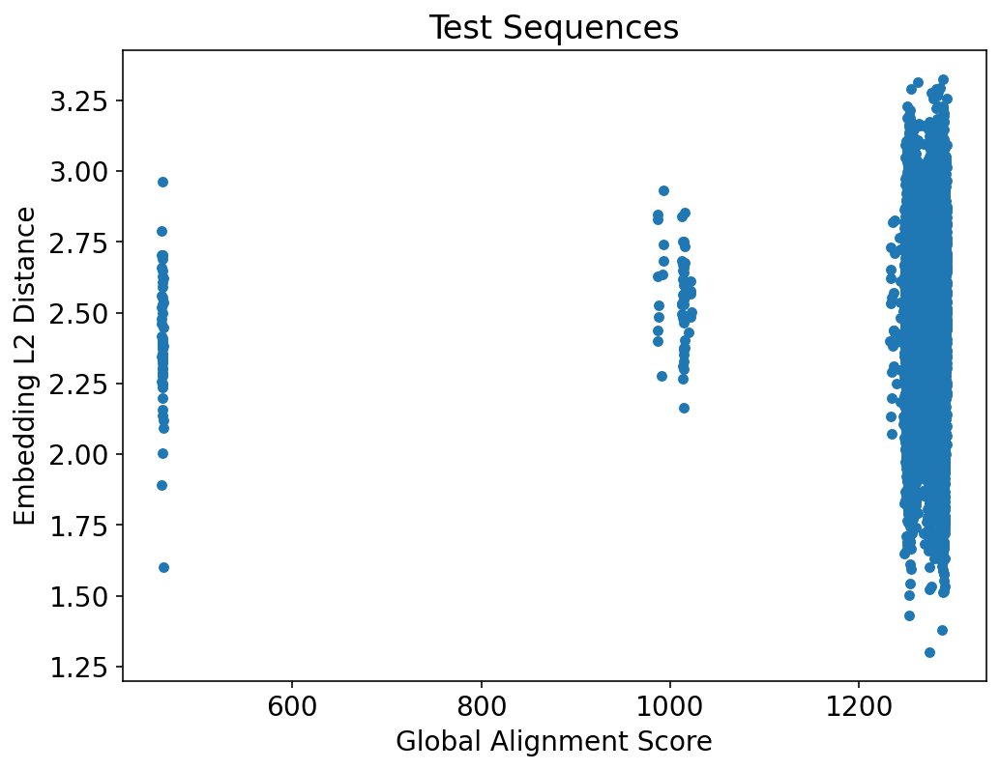

In [20]:
test_scores_df[::100].plot.scatter(y="Embedding L2 Distance", 
                              x="Global Alignment Score",
                             title="Test Sequences")

In [21]:
test_avg_scores_df = metrics.get_avg_scores_df(
    scores_df=test_scores_df, alignment_type=alignment_type
)
test_avg_scores_df.corr()

,avg_embed_dist,stdev_embed_dist,Global Alignment Score
avg_embed_dist,1.000000,-0.422542,-0.088634
stdev_embed_dist,-0.422542,1.000000,0.411949
Global Alignment Score,-0.088634,0.411949,1.000000


In [22]:
test_avg_scores_df

,avg_embed_dist,stdev_embed_dist,Global Alignment Score
0,2.575439,0.000000,416.0
1,2.423908,0.000000,460.0
2,2.330497,0.222426,461.0
3,2.377084,0.206164,462.0
4,2.368773,0.209746,463.0
...,...,...,...
106,2.459961,0.234527,1290.0
107,2.453661,0.230840,1291.0
108,2.500619,0.246707,1292.0
109,2.534495,0.244213,1293.0


'Alignment Score vs. Embedding Distance plot has been saved to /homes/lind/MDH-pipeline/visualize.'

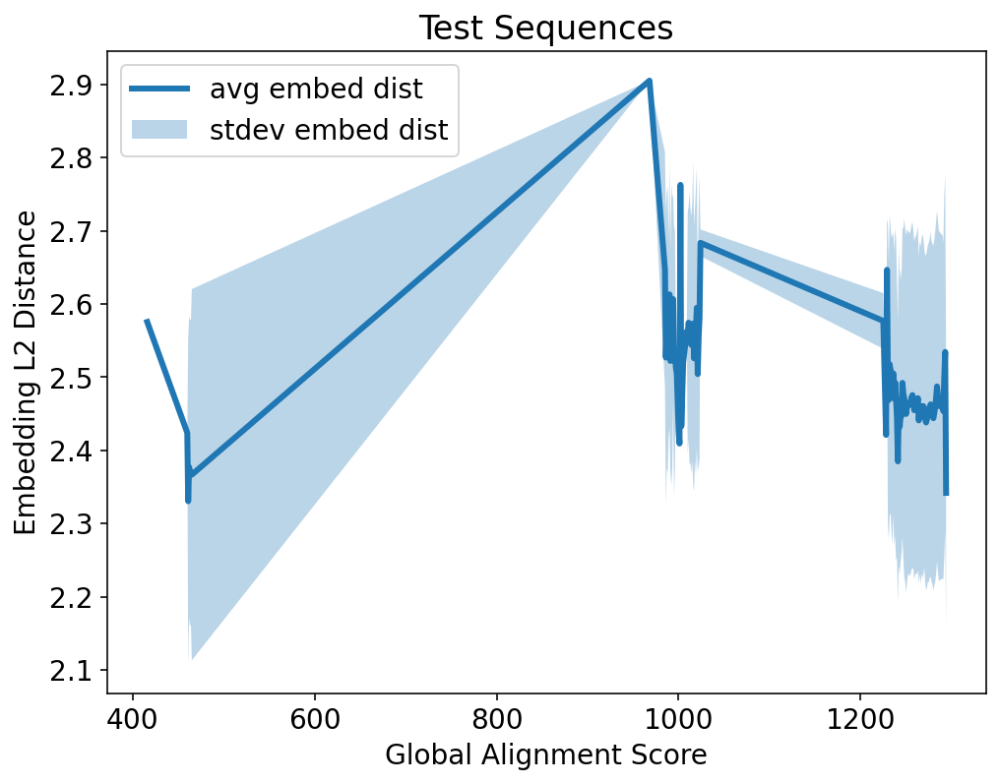

In [25]:
visualize.plot_embed_dist_vs_align_score(
    avg_scores_df=test_avg_scores_df,
    save_path=save_path,
    alignment_type=alignment_type,
    plot_title="Test Sequences")

### Train Sequences

In [43]:
train_embed_path = Path("/homes/mzvyagin/covid_spike_reformer/spike_reformer_10000sample_train_embeddings_mean.npy")
train_fasta_path = Path("/homes/lind/MDH-pipeline/covid_spike_data/train_10000_subsample.fasta")
cluster_path = Path("/homes/lind/MDH-pipeline/visualize/")

In [49]:
# get DNA sequences
dna_seqs_rec = metrics.get_seqs_from_fasta(fasta_path=train_fasta_path)
dna_seqs = SeqRec_to_Seq(rec_list=dna_seqs_rec)

In [50]:
invalid_inds = filter_dna_seqs(seqs=dna_seqs)
# print(invalid_inds)
print(len(invalid_inds))

1108


In [51]:
# clean dna sequences
dna_seqs_rec_clean = []
count = 0
# for ind in invalid_inds:
for i in range(len(dna_seqs_rec)):
    if i not in invalid_inds:
        dna_seqs_rec_clean.append(dna_seqs_rec[i])
    else:
        count += 1

print(len(dna_seqs_rec))
print(len(dna_seqs_rec_clean))
print(count)

10000
8892
1108


In [52]:
protein_seqs = metrics.dna_to_protein_seqs(dna_seqs=dna_seqs_rec_clean)

In [53]:
# clean embeddings
embed_avg = np.load(train_embed_path)

embed_avg_clean = []
for i in range(len(embed_avg)):
    if i not in invalid_inds:
        embed_avg_clean.append(embed_avg[i])

embed_avg_clean = np.array(embed_avg_clean)
print(len(embed_avg))
print(len(embed_avg_clean))

10000
8892


In [54]:
num_sample = 3600
rand_inds_list = rand_select(0, len(embed_avg_clean), num_sample)
rand_inds_list = list(set(rand_inds_list)) # remove the duplicate indices
# print(rand_inds_list)
# print(type(rand_inds_list))
print(len(rand_inds_list))

2933


In [55]:
# create a new list of protein_seqs with only the randomly selected indices
print(len(protein_seqs))
protein_seqs_select = []
for i in rand_inds_list:
    protein_seqs_select.append(protein_seqs[i])
print(len(protein_seqs_select))

8892
2933


In [56]:
# create a new array of embed_avg with only the randomly selected indices
embed_avg_select = []
for i in rand_inds_list:
    embed_avg_select.append(embed_avg_clean[i])
embed_avg_select = np.array(embed_avg_select)

# print(len(embed_avg_clean))
# print(embed_avg_clean)
# print(type(embed_avg_clean))

In [57]:
train_protein_align_scores_matrix = metrics.alignment_scores_parallel(
    seqs1_rec=protein_seqs_select,
    seqs2_rec=protein_seqs_select,
    alignment_type=alignment_type,
    num_workers=num_workers,
    match_score=match_score,
    mismatch_score=mismatch_score,
    open_gap_score=open_gap_score,
    extend_gap_score=extend_gap_score,
)

2933it [47:08,  1.04it/s]


In [60]:
train_scores_df = metrics.get_scores_df(
    embed_avg=embed_avg_select,
    scores_matrix=train_protein_align_scores_matrix,
    alignment_type=alignment_type,
)
train_scores_df.corr()

,Embedding L2 Distance,Global Alignment Score
Embedding L2 Distance,1.000000,-0.004764
Global Alignment Score,-0.004764,1.000000


<AxesSubplot:title={'center':'Test Sequences'}, xlabel='Global Alignment Score', ylabel='Embedding L2 Distance'>

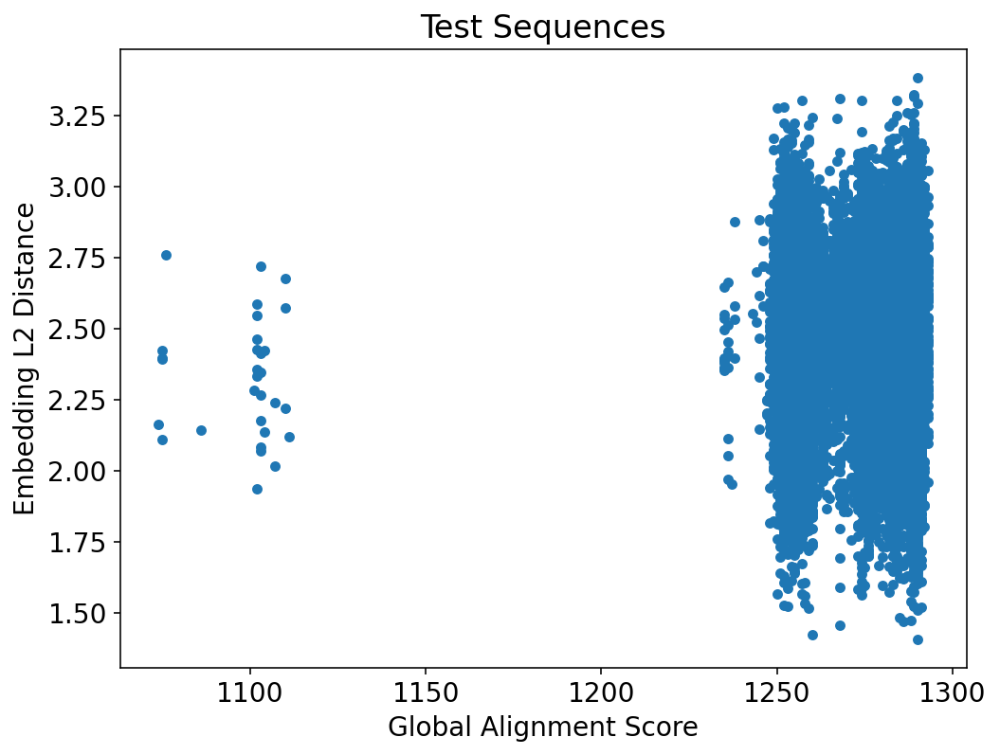

In [61]:
train_scores_df[::100].plot.scatter(y="Embedding L2 Distance", 
                              x="Global Alignment Score",
                             title="Test Sequences")

In [62]:
train_avg_scores_df = metrics.get_avg_scores_df(
    scores_df=test_scores_df, alignment_type=alignment_type
)
train_avg_scores_df.corr()

,avg_embed_dist,stdev_embed_dist,Global Alignment Score
avg_embed_dist,1.000000,-0.422542,-0.088634
stdev_embed_dist,-0.422542,1.000000,0.411949
Global Alignment Score,-0.088634,0.411949,1.000000


In [63]:
train_avg_scores_df

,avg_embed_dist,stdev_embed_dist,Global Alignment Score
0,2.575439,0.000000,416.0
1,2.423908,0.000000,460.0
2,2.330497,0.222426,461.0
3,2.377084,0.206164,462.0
4,2.368773,0.209746,463.0
...,...,...,...
106,2.459961,0.234527,1290.0
107,2.453661,0.230840,1291.0
108,2.500619,0.246707,1292.0
109,2.534495,0.244213,1293.0


'Alignment Score vs. Embedding Distance plot has been saved to /homes/lind/MDH-pipeline/visualize.'

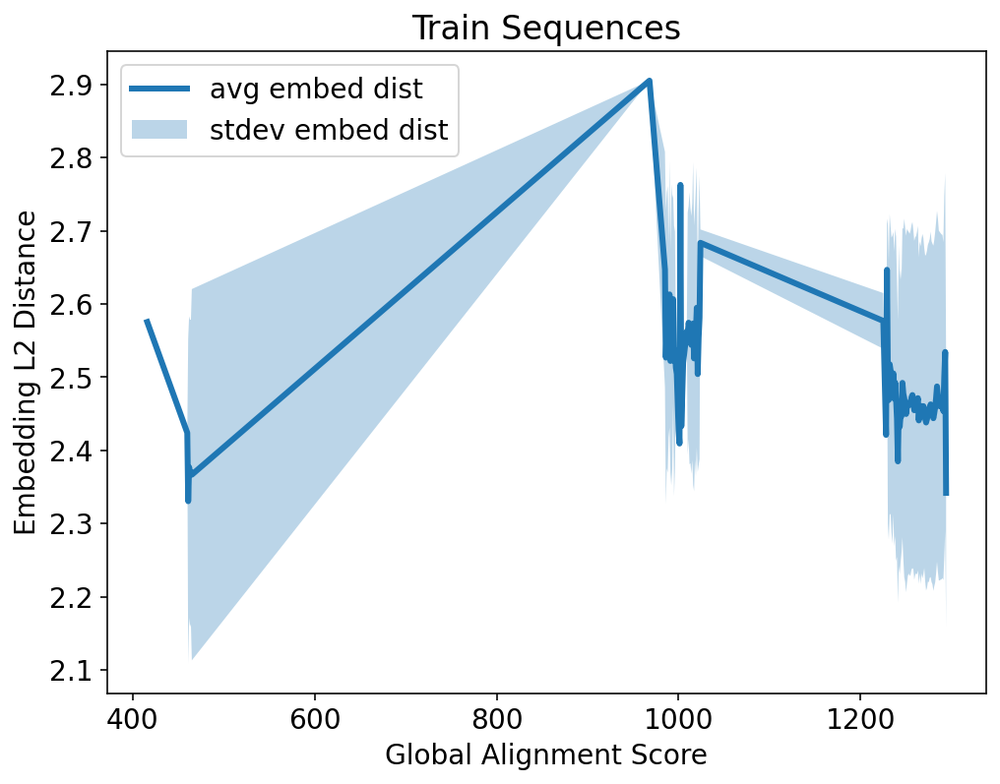

In [64]:
visualize.plot_embed_dist_vs_align_score(
    avg_scores_df=train_avg_scores_df,
    save_path=align_plot_path,
    alignment_type=alignment_type,
    plot_title="Train Sequences")

### Validation Sequences

In [26]:
val_embed_path = Path("/homes/mzvyagin/covid_spike_reformer/spike_reformer_10000sample_val_embeddings_mean.npy")
val_fasta_path = Path("/homes/lind/MDH-pipeline/covid_spike_data/val_10000_subsample.fasta")
save_path = Path("/homes/lind/MDH-pipeline/visualize/embed_dist_vs_align_score_val.png")
align_plot_title = "Validation Sequences"
alignment_type = "global"
num_workers = 70
match_score = 1.0
mismatch_score = 0.0
open_gap_score = 0.0
extend_gap_score = 0.0

In [30]:
# get DNA sequences
dna_seqs_rec = metrics.get_seqs_from_fasta(fasta_path=val_fasta_path)
dna_seqs = SeqRec_to_Seq(rec_list=dna_seqs_rec)

In [31]:
invalid_inds = filter_dna_seqs(seqs=dna_seqs)
# print(invalid_inds)
print(len(invalid_inds))

1121


In [32]:
# clean dna sequences
dna_seqs_rec_clean = []
count = 0
# for ind in invalid_inds:
for i in range(len(dna_seqs_rec)):
    if i not in invalid_inds:
        dna_seqs_rec_clean.append(dna_seqs_rec[i])
    else:
        count += 1

print(len(dna_seqs_rec))
print(len(dna_seqs_rec_clean))
print(count)

10000
8879
1121


In [33]:
protein_seqs = metrics.dna_to_protein_seqs(dna_seqs=dna_seqs_rec_clean)

In [34]:
# clean embeddings
embed_avg = np.load(val_embed_path)

embed_avg_clean = []
for i in range(len(embed_avg)):
    if i not in invalid_inds:
        embed_avg_clean.append(embed_avg[i])

embed_avg_clean = np.array(embed_avg_clean)
print(len(embed_avg))
print(len(embed_avg_clean))

10000
8879


In [35]:
num_sample = 3600
rand_inds_list = rand_select(0, len(embed_avg_clean), num_sample)
rand_inds_list = list(set(rand_inds_list)) # remove the duplicate indices
# print(rand_inds_list)
# print(type(rand_inds_list))
print(len(rand_inds_list))

2975


In [36]:
# create a new list of protein_seqs with only the randomly selected indices
print(len(protein_seqs))
protein_seqs_select = []
for i in rand_inds_list:
    protein_seqs_select.append(protein_seqs[i])
print(len(protein_seqs_select))

8879
2975


In [37]:
# create a new array of embed_avg with only the randomly selected indices
embed_avg_select = []
for i in rand_inds_list:
    embed_avg_select.append(embed_avg_clean[i])
embed_avg_select = np.array(embed_avg_select)

# print(len(embed_avg_clean))
# print(embed_avg_clean)
# print(type(embed_avg_clean))

In [38]:
val_protein_align_scores_matrix = metrics.alignment_scores_parallel(
    seqs1_rec=protein_seqs_select,
    seqs2_rec=protein_seqs_select,
    alignment_type=alignment_type,
    num_workers=num_workers,
    match_score=match_score,
    mismatch_score=mismatch_score,
    open_gap_score=open_gap_score,
    extend_gap_score=extend_gap_score,
)

2975it [46:03,  1.08it/s]


In [39]:
val_scores_df = metrics.get_scores_df(
    embed_avg=embed_avg_select,
    scores_matrix=val_protein_align_scores_matrix,
    alignment_type=alignment_type,
)
val_scores_df.corr()

,Embedding L2 Distance,Global Alignment Score
Embedding L2 Distance,1.000000,-0.023119
Global Alignment Score,-0.023119,1.000000


<AxesSubplot:title={'center':'Validation Sequences'}, xlabel='Global Alignment Score', ylabel='Embedding L2 Distance'>

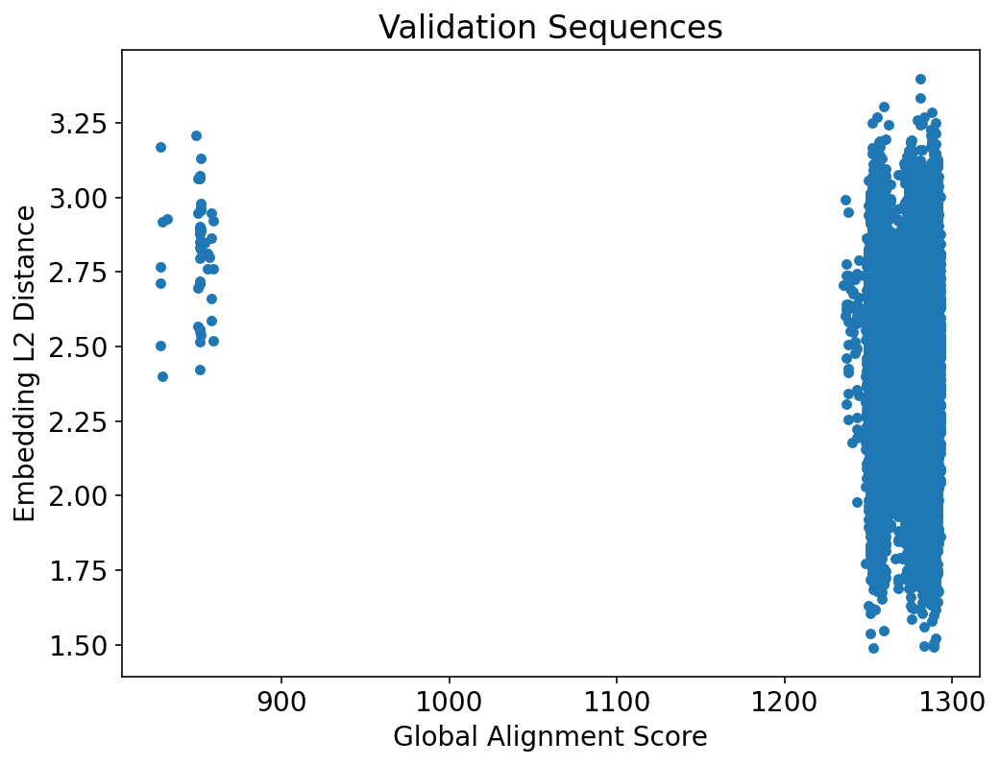

In [40]:
val_scores_df[::100].plot.scatter(y="Embedding L2 Distance", 
                              x="Global Alignment Score", 
                              title="Validation Sequences")

In [41]:
val_avg_scores_df = metrics.get_avg_scores_df(
    scores_df=val_scores_df, alignment_type=alignment_type
)
val_avg_scores_df.corr()

,avg_embed_dist,stdev_embed_dist,Global Alignment Score
avg_embed_dist,1.000000,-0.574443,-0.912178
stdev_embed_dist,-0.574443,1.000000,0.659166
Global Alignment Score,-0.912178,0.659166,1.000000


'Alignment Score vs. Embedding Distance plot has been saved to /homes/lind/MDH-pipeline/visualize.'

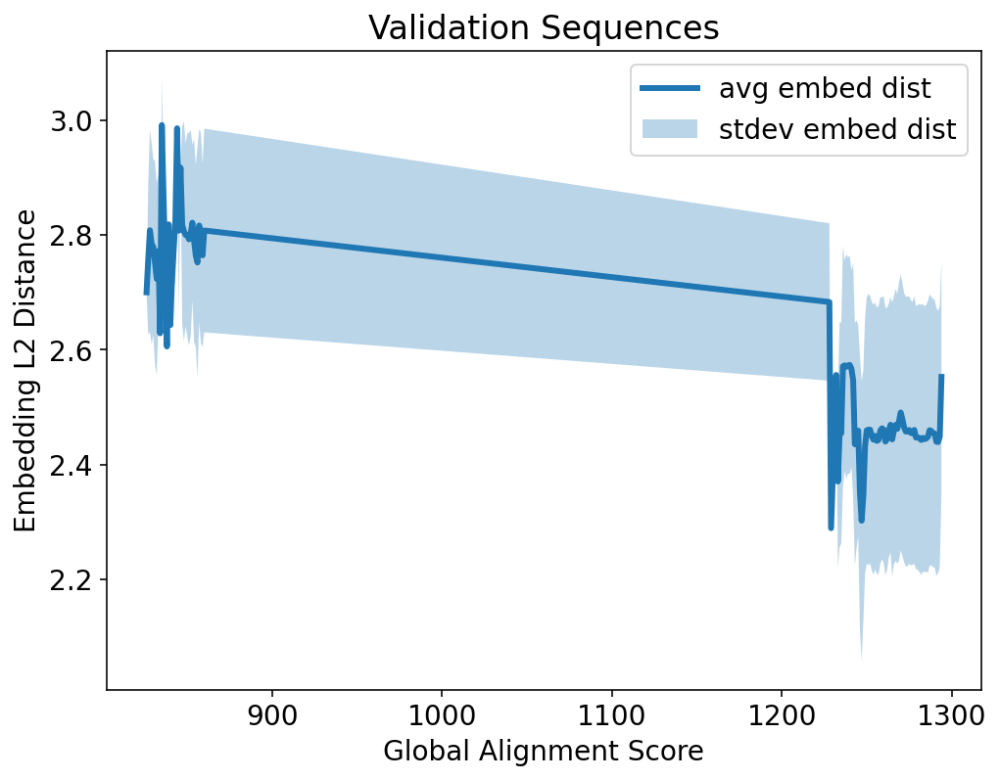

In [42]:
visualize.plot_embed_dist_vs_align_score(
    avg_scores_df=val_avg_scores_df,
    save_path=save_path,
    alignment_type=alignment_type,
    plot_title=align_plot_title
)